<a href="https://colab.research.google.com/github/kteppris/RealWaste/blob/main/2_EDA_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Explorative Datenanalyse (EDA)

Der Begriff der Explorativen Datenanalyse (EDA) geht auf Tukey [(1962)](https://www.jstor.org/stable/i312810) zurück, der den Begriff der Datenanalyse wie folgt definierte:
\
\
_"Procedures for analyzing data, techniques for interpreting the results of such procedures, ways of planning the gathering of data to make its analysis easier, more precise or more accurate, and all the machinery and results of (mathematical) statistics which apply to analyzing data."_
\
\
Die EDA zielt demnach darauf ab, mit statistischen Methoden die wesentlichen Strukturen eines Datensatzes zu entdecken, Muster und Anomalien zu identifizieren und die weiteren Analysen durch die gewonnenen Einblicke zu leiten.

Das DASC-PM v1.1 von Schulz et al. [(2022)](https://info.nordakademie.de/hubfs/Website%20Relaunch%202022/Forschungsthemen/DASC-PM_v1.1.pdf) verortet die EDA in der Projektphase der _Datenbereitstellung_.
Als Ergebnis dieser Projektphase ensteht aus einer oder mehreren _Ursprungsdatenquellen_ eine _Analytische Datenquelle_, die im weiteren Projektverlauf zu Analysezwecken genutzt wird.

Um diese Analytische Datenquelle zu erzeugen, ist die Bearbeitung der Kernaufgaben _Datenaufbereitung_, _Datenmanagement_ und _Explorative Datenanalyse_ erforderlich.

Das DASC-PM v1.1 schreibt für die EDA keine feste Abfolge für anzuwenende Verfahren vor, da auch ihre Auswahl vom Untersuchungsgegenstand abhängig ist.

Beim Untersuchungsgegenstand dieser Ausarbeitung, dem [RealWaste-Datensatz](https://github.com/sam-single/realwaste/tree/main), handelt es sich um Bilddateien und somit um unstrukturierte, hochdimensionale Daten, die aus einer Vielzahl von Pixelwerten bestehen.

Die nachfolgende EDA zielt darauf ab, für den untersuchten Datensatz die Verteilung über die Klassen zu ermitteln und eine zufällige Auswahl von Bildern aus dem Datensatz einer ersten visuellen Inspektion zu unterziehen. \
Aus dieser Erstinspektion werden weitere Schritte im Rahmen der EDA zu weiterführenden Untersuchungen durch _Farbhistogramme_, _Local Binary Patterns (LBP)_ und _Sobel-Filter_ abgeleitet. Diese weiterführenden Untersuchungen zielen darauf ab, Features aus den Bildern des RealWaste-Datensatzes zu extrahieren. \

Ein weiteres Ziel der EDA ist es, die gewonnenen Features mit klassischen ML-Methoden wie K-Nearest-Neigbors (KNN), Support Vector Machines (SVM) oder Random Forest für eine Klassifikation der Bilder einzusetzen.

Die zentralen Erkenntnisse der EDA werden in Form von Artefakten (Visualisierungen oder Modelle) festgehalten.

Der Ansatz, klassische Modelle zu nutzen, trägt zu einer effizienten Ressourcennutzung bei, indem er frühzeitig Aufschluss darüber gibt, ob und in welchem Maße tiefergehende, ressourcenintensive Deep-Learning-Verfahren potenziell zu einer signifikanten Verbesserung der Modellleistung führen könnten. Somit stellt die durchgeführte EDA in Verbindung mit der Anwendung klassischer ML-Methoden auf zuvor extrahierte Features eine fundierte Basis dar, auf der weiterführende, komplexere Analyseverfahren aufbauen können.
Die Ergebnisse aus dem Training klassischer ML-Modelle bieten im Zuge der Zielsetzung dieser Ausarbeitung ferner wertvolle Benchmarks für den Vergleich mit später implementierten Deep-Learning-Modellen.
<br>
<br>
Das vorliegende EDA-Notebook ist hierfür in folgende Sinnabschnitte gegliedert:
* **Daten laden und vorverarbeiten für die EDA** <br>
Für eine schnellere Verarbeitung der Daten werden die Daten auf ein Format von 128x128 Pixeln skaliert.
* **Datensatz erkunden** <br>
Die Gesamtzahl der Bilder und ihre Verteilung auf die Klassen wird untersucht; zudem werden beispielhaft für jede Klasse 3 zufällige Bilder visuell ausgegeben, was eine stichprobenartige visuelle Inspektion ermöglicht.
* **Feature Engineering** <br>
Basierend auf der vorangegangenen visuellen Inspektion des Datensatzes werden mögliche Features für den Datensatz abgeleitet und extrahiert. Hierbei handelt es sich um _Farbfeatures_, _Kantenfeatures_ und _Texturfeatures_. Zudem erfolgt eine Visualisierung dieser extrahierten Features im klassenübergreifenden Vergleich, um Anhaltspunkte für ihre Relevanz zu gewinnen.
* **Zusammenführung der extrahierten Features in Form eines DataFrames** <br>
Dieser Schritt wird durchgeführt, um die Relevanz der Features nachfolgend gemeinsam prüfen zu können. Im Sinne des DASC-PM v1.1 kann dieses DataFrame in Verbindung mit den späteren Modellergebnissen als _Analytische Datenquelle_ verstanden werden.
* **Chi^2-Unabhängigkeitstest** <br>
Der Test dient der Prüfung der statistischen Unabhängikeit der extrahierten Features mit der Klassenzugehörigkeit. Diese Überprüfung bietet Anhaltspunkte für die Bewertung der Nützlichkeit der gewonnenen Features für das spätere Modelltraining.
* **Principal Component Analyse (PCA)** <br>
Die relevanten extrahierten Features werden in eine geringere Anzahl an Hauptkomponenten transformiert, welche den Großteil der Varianz in den Daten erfassen können. Diese Reduktion ermöglicht eine effizientere Datenverarbeitung durch Komplexitätsreduktion bei möglichst großer Informationsbeibehaltung.
Die Ergebnisse der PCA werden visualisiert, um die Verständlichkeit und Interpretierbarkeit der Daten zu verbessern und eine fundierte Basis für die anschließende Modellierung zu schaffen.
* **Modelltraining und -evaluation** <br>
In diesem letzten Abschnitt des EDA-Notebooks erfolgt das Training mit klassischen ML-Modellen sowie ein Hyperparametertuning, eine Kreuzvalidierung und eine Ergebnisvisualisierung. Die Ergebnisse für jeden Modellansatz werden hierbei durch einen Klassifikationsreport in Verbindung mit einer Konfusionsmatrix präsentiert.

***
**Quellen:**
* Schulz et al. (2022) - DASC-PM v1.1 \
https://info.nordakademie.de/hubfs/Website%20Relaunch%202022/Forschungsthemen/DASC-PM_v1.1.pdf
* Tukey, J. W. (1962). The Future of Data Analysis. The Annals of Mathematical Statistics, 33(1), 1–67. \
http://www.jstor.org/stable/2237638
* RealWaste-Datensatz \
https://ieee-dataport.org/documents/realwaste#:~:text=RealWaste%20is%20an%20image%20dataset,facility%20in%20Wollongong%20NSW%20Australia.

***

## Daten laden und vorverarbeiten für die EDA

In [ ]:
import sys
import os
from pathlib import Path

# Funktion, die prüft, ob dieses Skript in Colab ausgeführt wird
def in_colab():
    # sys beinhaltet alle bereits geladenen Pakete
    return 'google.colab' in sys.modules  # google.colab wird automatisch in Colab vorgeladen, daher Indiz für Colab Environment

code_repo_path = Path("/content/drive/MyDrive/MADS/RealWaste") if in_colab() else Path.cwd()

if in_colab():
    # Google Drive einbinden zum persistieren von Code, Daten und Ergebnissen
    from google.colab import drive
    drive.mount('/content/drive')
    if not code_repo_path.exists():
        raise FileNotFoundError("Code und Datenordner konnte nicht gefunden werden. Bitte zuerst das Notebook '1_Hauptnotebook.ipynb' ausführen.")
    else:
        # wechsle Arbeitsverzeichnis zu code_repo_path
        %cd {code_repo_path}
        print(f"Wechsel Arbeitsverzeichnis zu {Path.cwd()}")
        %pip install -r requirements.txt
else:
    print("Stellen Sie sicher, dass das richtige Venv als Kernel ausgewählt ist,\nwelches wie in '1_Hauptnotebook.ipynb' beschrieben erstellt wurde.")

data_path = code_repo_path / "data"

Mounted at /content/drive
/content/drive/MyDrive/MADS/RealWaste
Wechsel Arbeitsverzeichnis zu /content/drive/MyDrive/MADS/RealWaste
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 800.9/800.9 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 413.4/413.4 kB 26.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.4/840.4 kB 32.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 24.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 10.5 MB/s eta 0:00:00


In [ ]:
# Überprüfe den aktuellen Arbeitsordner
print("Current Directory:", os.getcwd())

# Listet den Inhalte des Datenverzeichnisses auf und gibt die Namen der Klassen-Unterordner aus
print("Directory Contents:", os.listdir('./data'))

Current Directory: /content/drive/MyDrive/MADS/RealWaste
Directory Contents: ['Cardboard', 'Food Organics', 'Glass', 'Metal', 'Miscellaneous Trash', 'Paper', 'Plastic', 'Textile Trash', 'Vegetation']


In [ ]:
import os
from PIL import Image
import numpy as np

def load_and_resize_images(data_path, new_size): # Bilder neu skaliert mit dem Argument 'new_size(,)'
    images_resized = {}
    class_names = [d for d in os.listdir(data_path) if os.path.isdir(os.path.join(data_path, d)) and not d.startswith('.')]  # Versteckte Ordner überspringen

    for class_name in class_names:
        class_folder = os.path.join(data_path, class_name)
        image_files = [f for f in os.listdir(class_folder) if f.endswith('.jpg') and not f.startswith('.')]  # Nur .jpg Bilder verarbeiten
        images_resized[class_name] = []

        for image_file in image_files:
            img_path = os.path.join(class_folder, image_file)
            img = Image.open(img_path)
            img_resized = img.resize(new_size)
            images_resized[class_name].append(np.array(img_resized))

    return images_resized

# Neue Größe auf die Bilder aus meinem Ordner anwenden
images_resized = load_and_resize_images(data_path=data_path, new_size = (128, 128))

## Datensatz erkunden

In [ ]:
def get_images_shape_info(images_resized):
    total_images = sum(len(images) for images in images_resized.values())
    # Die Größe und Anzahl der Farbkanäle des ersten Bildes in der ersten Klasse ermitteln
    # Diese Info reicht hier aus, da alle Bilder zuvor auf die gleiche Größe skaliert wurden
    for images in images_resized.values():
        if images:
            image_shape = images[0].shape  # (Höhe, Breite, Farbkanäle)
            break

    print(f"Gesamtanzahl der Bilder: {total_images}")
    print(f"Größe eines Bildes in Pixeln: {image_shape[:2]}")

get_images_shape_info(images_resized)

Gesamtanzahl der Bilder: 4752
Größe eines Bildes in Pixeln: (128, 128)


### Anzahl Bilder und Verteilung auf die Klassen

Der RealWaste-Datensatz enthält insgesamt 4.752 Bilder, welche sich auf 9 Klassen verteilen. Die Verteilung auf die Klassen ist im gegebenen Datensatz nicht ausgeglichen, ihre relativen Anteile an der Gesamtmenge an Bildern reichen von ~6,7% (Textile Trash) bis zu ~19,4% (Plastic). Die relativen Anteile aller Klassen am Gesamtdatensatz sind dem nachfolgenden Balkendiagramm zu entnehmen.

In [ ]:
# Alle Klassenordner auflisten
classes = os.listdir(data_path)

# Erstelle ein Dictionary
images_per_class = {}

for class_name in classes:
    # Pfad zum Klassenordner
    class_path = os.path.join(data_path, class_name)

    # Alle Dateien in diesem Klassenordner auflisten
    images = [img for img in os.listdir(class_path) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]

    # Anzahl der Bilder in diesem Klassenordner zählen
    image_count = len(images)
    images_per_class[class_name] = image_count

# Ergebnisse ausgeben
for class_name, count in images_per_class.items():
    print(f"Class '{class_name}' beinhaltet {count} Bilder")

Class 'Cardboard' beinhaltet 461 Bilder
Class 'Food Organics' beinhaltet 411 Bilder
Class 'Glass' beinhaltet 420 Bilder
Class 'Metal' beinhaltet 790 Bilder
Class 'Miscellaneous Trash' beinhaltet 495 Bilder
Class 'Paper' beinhaltet 500 Bilder
Class 'Plastic' beinhaltet 921 Bilder
Class 'Textile Trash' beinhaltet 318 Bilder
Class 'Vegetation' beinhaltet 436 Bilder


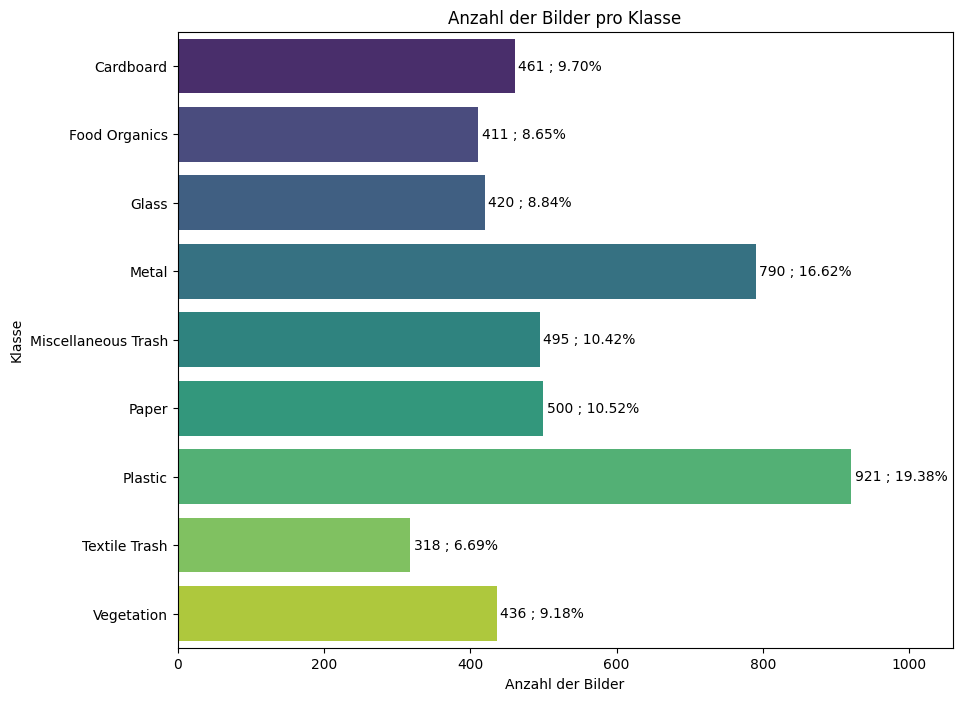

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


# Daten für das Balkendiagramm vorbereiten
class_names = list(images_per_class.keys())
image_counts = list(images_per_class.values())

# Gesamtanzahl der Bilder berechnen
total_images = sum(image_counts)

# Balkendiagramm erstellen
plt.figure(figsize=(10, 8))
sns.barplot(x=image_counts, y=class_names, palette="viridis")
plt.title('Anzahl der Bilder pro Klasse')
plt.xlabel('Anzahl der Bilder')
plt.ylabel('Klasse')

# Rechten Rand für Textbeschriftungen erhöhen
plt.xlim(0, max(image_counts) * 1.15)  # 15% mehr Platz für Beschriftungen

# Beschriftungen mit Prozentangabe hinzufügen
for index, value in enumerate(image_counts):
    percentage = (value / total_images) * 100  # Prozentualen Anteil berechnen
    plt.text(value + max(image_counts) * 0.005, index, f"{value} ; {percentage:.2f}%", va='center')  # Etwas Puffer hinzufügen, damit die Beschriftung ins Diagramm passt

plt.show()

### Beispielbilder für jede Klasse anzeigen

Nach der erfolgten quantitativen Untersuchung im Hinblick auf die Verteilung der Bilder auf die Klassen, wird nachfolgend der Datensatz stichprobenartig einer Sichtprüfung unterzogen. \
Hierfür werden je drei zufällige Bilder aus jeder der neun Klassen in Form einer 3x9-Matrix ausgegeben. \
Durch ein erneutes Ausführen des zugehörigen Codes können neue zufällige Bilder für jede Klasse geladen werden. \

Die Inaugenscheinnahme randomisierter Bilder aus dem Datensatz lieferte die Basis für folgende Beobachtungen: \
* Die Hintergründe der Bilder sind uneinheitlich gefärbt und texturiert; es ließen sich keine Hintergrundfärbungen zu bestimmten Klassen 1:1 zuordnen.
* Einige Farben scheinen deutlich häufiger in bestimmten Klassen aufzutreten als andere Farben. (Z.B. _Blautöne_ bei _Paper_ oder _Plastic_, nicht aber bei _Food Organics_ oder _Vegetation_)
* Bestimmte Formen/Kanten treten in einigen Klassen häufiger auf als in anderen Klassen. (Z.B. rechtwinklige Ecken eher in _Metall_ oder _Cardboard_ als in _Food Organics_).
* Bestimmte Texturen in den Bildern könnten mit den Klassen assoziiert sein. Es hat beispielsweise den Anschein, als wären glatte Texturen z.B. häufiger bei _Cardboard_ vertreten als bei beispielsweise bei _Vegetation_.

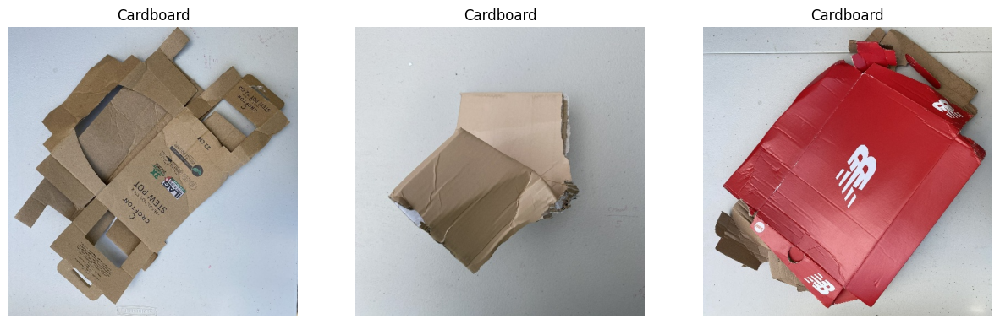

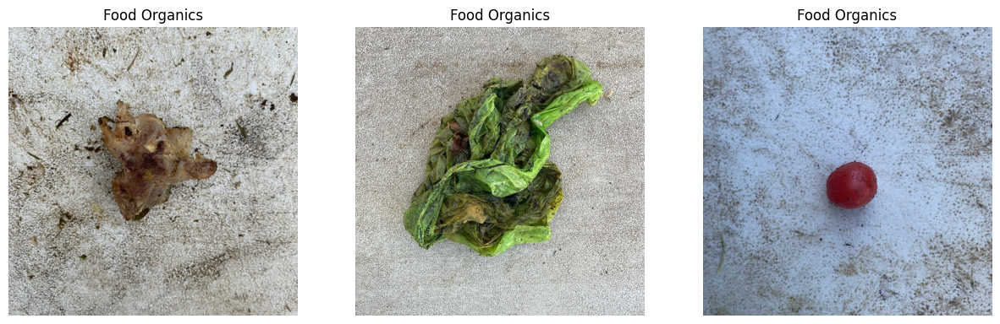

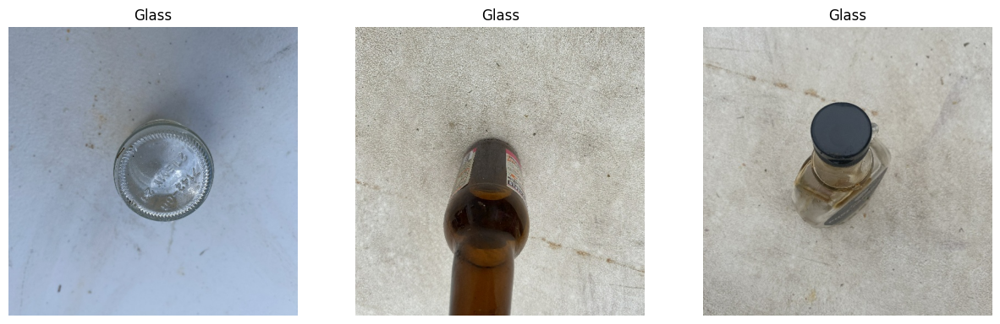

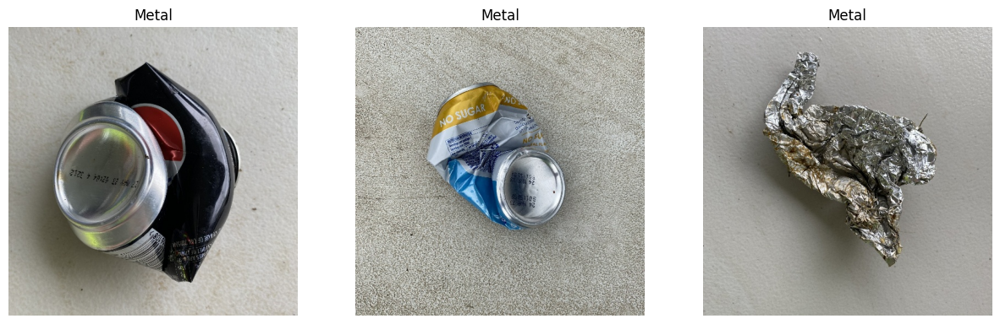

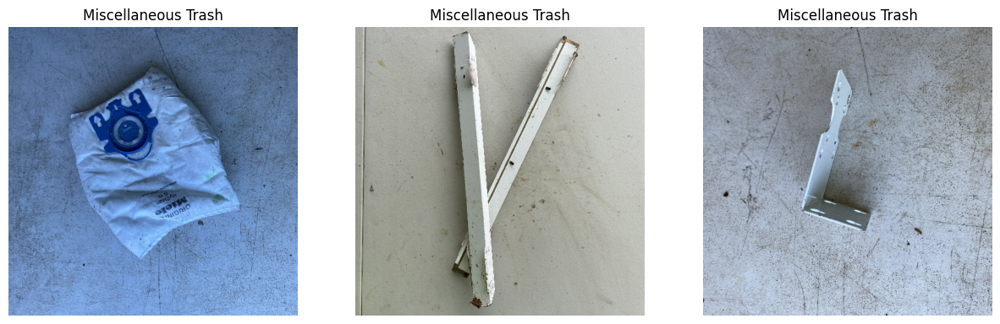

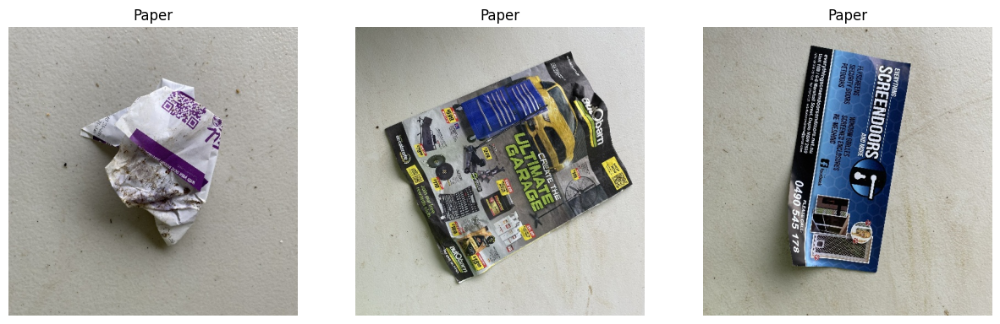

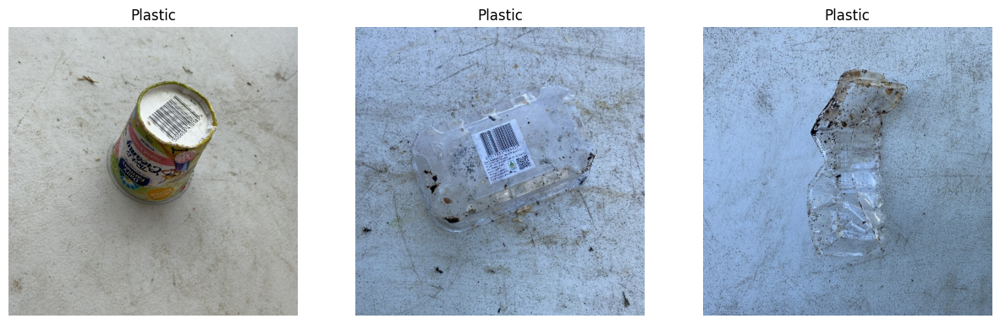

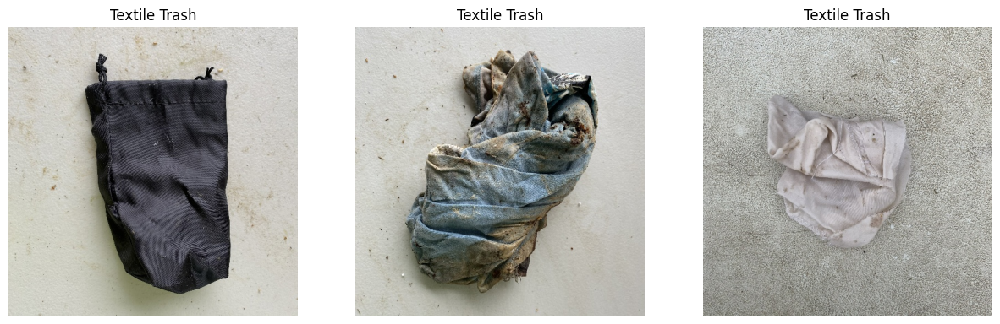

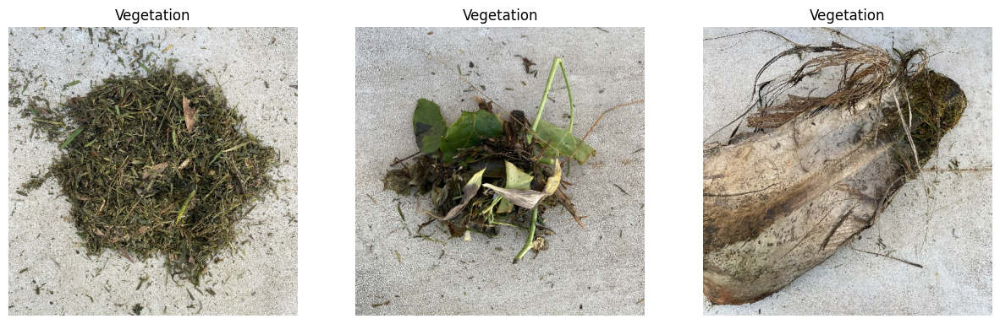

In [ ]:
import random
from PIL import Image

# 'class_names' enthält die Namen aller Klassen
for class_name in class_names:
    # Pfad zum Klassenordner
    class_folder = os.path.join(data_path, class_name)

    # Liste aller Bilddateien in diesem Ordner
    image_files = os.listdir(class_folder)

    # Wähle zufällige Bilder
    selected_images = random.sample(image_files, 3)

    # Zeige diese Bilder an
    plt.figure(figsize=(15, 5))
    for i, image_file in enumerate(selected_images):
        img_path = os.path.join(class_folder, image_file)
        img = Image.open(img_path)
        plt.subplot(1, 3, i+1)
        plt.imshow(img)
        plt.title(class_name)
        plt.axis('off')
    plt.show()


## Feature Engineering

Feature Engineering stellt eine zentrale Aufgabe im Zuge der Datenaufbereitung für maschinelles Lernen dar (vgl. Nargesian et al. [(2017)](https://doi.org/10.24963/ijcai.2017/352.), S. 2529). Hierbei werden aus gegebenen Merkmalen eines Datensatzes neue Merkmale konstruiert, die zu einer Steigerung der Vorhersageleistung von Modellen beitragen (vgl. ebd.). Hierfür werden Transformationsfunktionen wie arithmetische oder aggregierte Operatoren auf bestehende Merkmale zur Erzeugung der neuen Merkmale angewendet (vgl. ebd.).

Aus der zuvor durchgeführten Erkundung des Datensatzes wird die Vermutung abgeleitet, dass die _Farben_, _Kanten_ und die _Textur_ der in den Bildern gezeigten Abfallobjekte maßgeblich zu ihrer erfolgreichen Klassifikation beitragen könnten.
Um diese Vermutung zu überprüfen, werden im nachfolgenden Abschnitt neue Merkmale konstruiert.
Die Konstruktion der Merkmale soll im Fall von _Farbfeatures_ mithilfe von _Farbhistogrammen_, beim _Kantenfeature_ mithilfe eines _Sobel-Filters_ und für das _Textur-Feature_ über _Local-Binary-Patterns (LBP)_ erfolgen. \

Eine integrierte Betrachtung von Farbhistogrammen in Verbindung mit weiteren Features zu Textur- und Formmerkmalen können erheblich zur klassifikationsleistung von Modellen bei Bilddaten beitragen (vgl. Liu und Yang [(2013)](https://www.sciencedirect.com/science/article/abs/pii/S0031320312002713), S. 197). In diesem Zuge sprechen die Autoren von _content-based image retrival_ (CIBR) (vgl. ebd., S. 188).

Für das Training klassischer ML-Modelle im Rahmen dieser EDA soll eine integrierte Berücksichtigung von farb-, kanten- und texturbezogenen Merkmalen erfolgen, sofern diese eine hinreichende Relevanz für die Klassifikation der Bilder aufweisen.

***
**Quellen:**
* Nargesian, F., Samulowitz, H., Khurana, U., Khalil, E., & Turaga, D. (2017). Learning Feature Engineering for Classification. , 2529-2535. https://doi.org/10.24963/ijcai.2017/352.
* Liu, G., & Yang, J.-y. (2013). Content-based image retrieval using color difference histogram. Pattern Recognition, 46(1), 188-198 https://www.sciencedirect.com/science/article/abs/pii/S0031320312002713


***

### Labels extrahieren

In [ ]:
def extract_labels_as_array(images):
    # Initialisiere eine leere Liste für die Labels
    labels_list = []

    # Loop durch alle Klassen und Bilder
    for class_name, imgs in images.items():
        # Klassennamen anfügen
        labels_list.extend([class_name] * len(imgs))

    # Label-Liste als np.array konvertieren
    labels_array = np.array(labels_list)

    return labels_array

label_array = extract_labels_as_array(images_resized)
label_array.shape

(4752,)

### Farbfeature extrahieren  und visualisieren: mean und std der Farbwerte für die Bilder

Für das _Farbfeature_ werden statistische Merkmale (Standardabweichung und Mittelwert) für jeden der drei Farbkanäle (Rot, Grün, Blau) aus den Bildern des Datensatzes extrahiert.

Einen Anhaltspunkt für die Relevanz dieser Features geben die nachfolgend für alle Klassen ausgegebenen Histogramme, welche die extrahierten Features vergleichend gegenüberstellen.

In [ ]:
import numpy as np
import pandas as pd

def extract_statistical_features_dataframe(images):

    all_features = []

    # Spaltennamen für das Dataframe festlegen
    columns = ['red_mean', 'red_std', 'green_mean', 'green_std', 'blue_mean', 'blue_std']

    # Loop
    for _, imgs in images.items():
        # Verarbeite jedes Bild in der Klasse
        for img in imgs:
            # initialisiere ein Dictionary für die Features jeder Klasse
            img_features = {}

            # statistische Parameter für jeden Farbkanal (RBG) errechnen
            for i, color in enumerate(['red', 'green', 'blue']):  # RGB channels
                channel = img[:, :, i]
                img_features[f'{color}_mean'] = np.mean(channel)
                img_features[f'{color}_std'] = np.std(channel)
            # Features des Bildes zur Liste all_features hinzufügen
            all_features.append(img_features)

    # Konvertiere die Liste der dictionaries in ein DataFrame
    features_df = pd.DataFrame(all_features, columns=columns)

    return features_df

df_features_reduced_combined = extract_statistical_features_dataframe(images_resized)
df_features_reduced_combined

,red_mean,red_std,green_mean,green_std,blue_mean,blue_std
0,168.503540,32.215154,170.616028,36.638167,171.028564,44.670467
1,173.499939,39.203376,172.930908,43.416050,167.939941,50.787999
2,151.504333,25.128986,159.249634,30.561417,168.499756,38.381649
3,159.893921,35.130216,165.596924,44.562195,171.897034,57.273066
4,146.946960,24.629529,156.082642,31.644635,168.250244,40.639512
...,...,...,...,...,...,...
4747,151.340454,59.774400,148.608154,61.164567,134.677368,68.175550
4748,151.768494,60.347893,149.364807,61.510328,135.527344,68.372839
4749,154.951416,59.333166,152.153076,61.195001,137.555908,69.744840
4750,154.458679,57.086545,152.926086,58.102958,141.966736,64.977466


In [ ]:
# Farbfeature visualisieren

# Neues DF für die Erstellung der Histogramme für die Farbfeatures erzeugen

df_features_reduced_combined_labeled = df_features_reduced_combined.copy()
df_features_reduced_combined_labeled['label'] = label_array

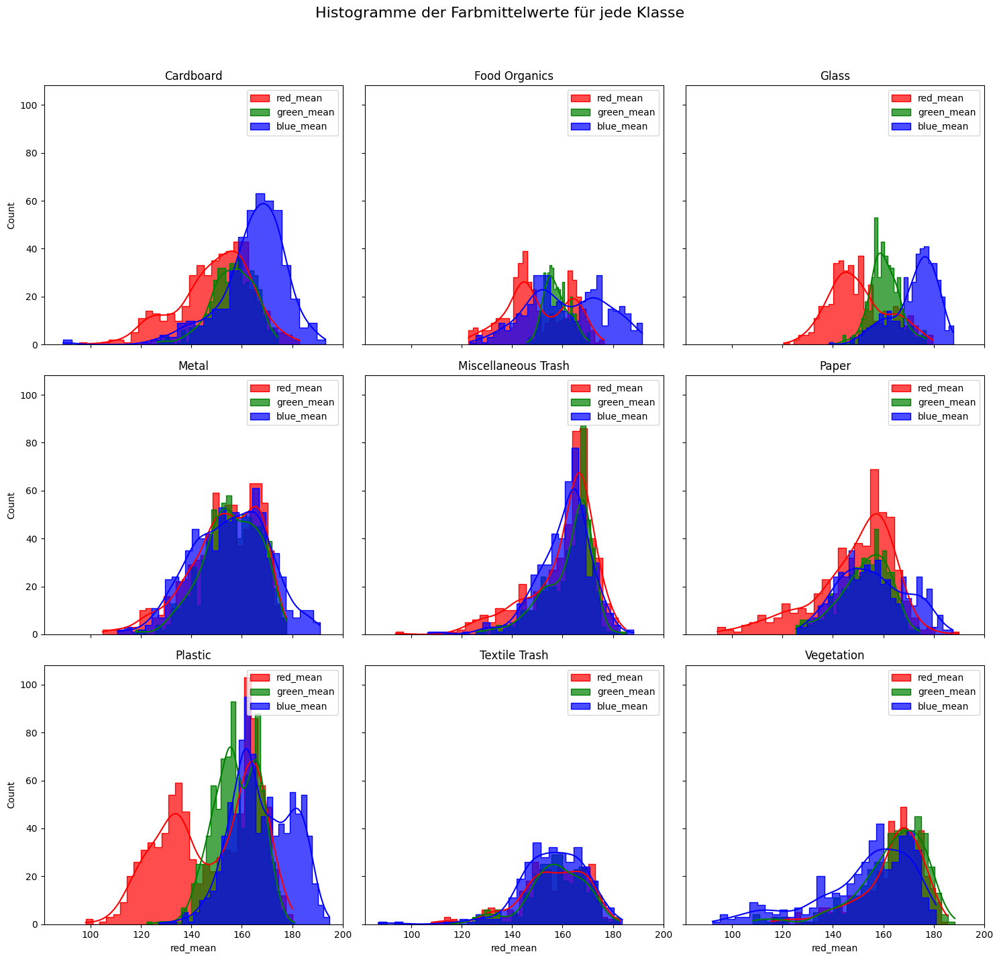

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Eindeutige Labels extrahieren
labels = df_features_reduced_combined_labeled['label'].unique()

# Farben definieren
colors = {'red_mean': 'red', 'green_mean': 'green', 'blue_mean': 'blue'}

# Figure und Axes für die 3x3-Matrix erstellen
fig, axes = plt.subplots(3, 3, figsize=(15, 15), sharex=True, sharey=True)

# Flaches Array aus Axes für einfacheren Zugriff
axes_flat = axes.flatten()

# Für jedes Label und jeden entsprechenden Subplot ein Histogramm der Farbmittelwerte erzeugen
for i, label in enumerate(labels):
    ax = axes_flat[i]
    for color_mean in ['red_mean', 'green_mean', 'blue_mean']:
        sns.histplot(df_features_reduced_combined_labeled[df_features_reduced_combined_labeled['label'] == label][color_mean], color=colors[color_mean], label=color_mean, kde=True, element='step', alpha=0.7, bins=30, ax=ax)
    ax.set_title(label)
    ax.legend()

# Überschrift für die gesamte Figure setzen
fig.suptitle('Histogramme der Farbmittelwerte für jede Klasse', fontsize=16)

# Anpassung des Layouts für bessere Darstellung
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


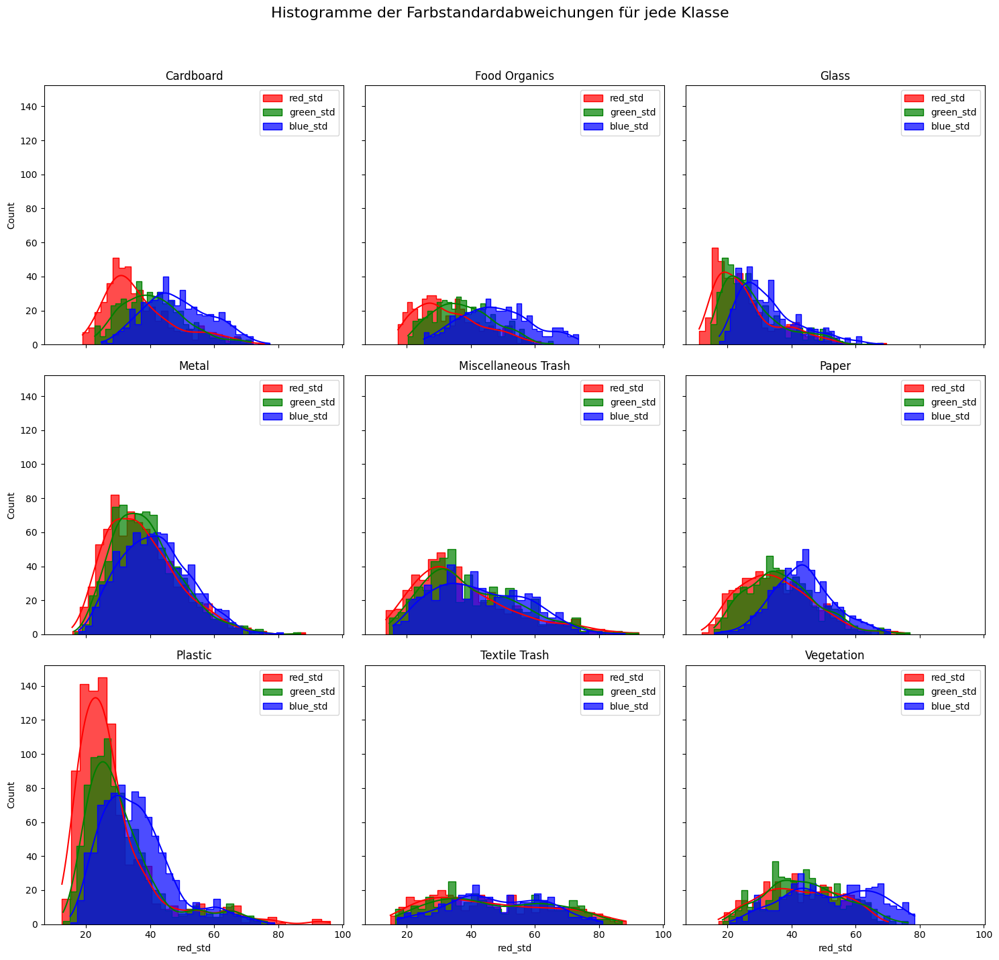

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Eindeutige Labels extrahieren
labels = df_features_reduced_combined_labeled['label'].unique()

# Farben für die Standardabweichungen definieren
colors_std = {'red_std': 'red', 'green_std': 'green', 'blue_std': 'blue'}

# Figure und Axes für die 3x3-Matrix erstellen (für Standardabweichungen)
fig_std, axes_std = plt.subplots(3, 3, figsize=(15, 15), sharex=True, sharey=True)

# Flaches Array aus Axes für einfacheren Zugriff
axes_flat_std = axes_std.flatten()

# Für jedes Label und jeden entsprechenden Subplot ein Histogramm der Standardabweichungen erstellen
for i, label in enumerate(labels):
    ax = axes_flat_std[i]
    for color_std in ['red_std', 'green_std', 'blue_std']:
        sns.histplot(df_features_reduced_combined_labeled[df_features_reduced_combined_labeled['label'] == label][color_std], color=colors_std[color_std], label=color_std, kde=True, element='step', alpha=0.7, bins=30, ax=ax)
    ax.set_title(label)
    ax.legend()

# Überschrift für die gesamte Figure setzen
fig_std.suptitle('Histogramme der Farbstandardabweichungen für jede Klasse', fontsize=16)

# Anpassung des Layouts für bessere Darstellung
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


### Kantenfeature extrahieren und visualisieren: Sobel-Filter

Mit dem nachfolgenden Code werden Kantenmerkmale aus den Bildern des untersuchten Datensatzes extrahiert. Für diese Featureextraktion wird ein _Sobel-Filter_ eingesetzt (vgl. scipy sobel [(2024)](https://docs.scipy.org/doc/scipy/reference/generated/scipy.ndimage.sobel.html)).

Die _sobel_sum_ wird als neues Feature in Form einer Kennzahl pro Bild gebildet. Für dieses neue Feature wird der Sobel-Filter sowohl in horizontaler als auch in vertikaler Richtung auf die Bilder zur Kantendetektion angewendet. Die sobel_sum stellt die Summe der horizontalen und vertikalen Kantenpixel für jedes Bild dar.
Der Bildung dieses Features liegt die Überlegung zugrunde, ein stark aggrgiertes Maß für die Kantenstärke und -präsenz im gesamten Bild zu erhalten, um es für die Bildklassifikation nutzen zu können.

Zudem wird eine Visualisierung für die Anwendung des Sobel-Filters ausgegeben, um seine Anwendung und seinen Nutzen für die Bildanalyse zu illustrieren.

Im Anschluss der beispielhaften Verwendung des Sobel-Filters auf ein zufälliges Bild wird das neu gebildete Merkmal _sobel_sum_ in Form von Histogrammen für jede Klasse aufbereitet. Diese Visualisierung dient als Anhaltspunkt dafür, wie unterschiedlich oder ähnlich die Strukturen in Bezug auf das Feature _sobel_sum_ klassenübergreifend sind.

***
**Quellen:**
* scipy sobel (2024) - Dokumentation zu SciPy <br>
Abgerufen am 27.02.2024 unter: <br>
https://docs.scipy.org/doc/scipy/reference/generated/scipy.ndimage.sobel.html
***

In [ ]:
# Extraktion des feature_array_sobel für die vorverarbeiteten Daten über die Funktion 'extract_sobel_features'

from scipy.ndimage import sobel
from skimage.color import rgb2gray
import numpy as np

def extract_sobel_features(images):
    sobel_features = []
    for class_images in images.values():
        for img in class_images:
            # Umwandlung in Graustufen, da das Bild in RBG ist
            if len(img.shape) == 3:
                img = rgb2gray(img)

            # Anwenden des Sobel-Filters
            sobel_horizontal = sobel(img, axis=0)  # horizontaler Kantendetektor
            sobel_vertical = sobel(img, axis=1)  # vertikaler Kantendetektor

            # Kombination der horizontalen und vertikalen Kanten zu einem Bild
            sobel_combined = np.hypot(sobel_horizontal, sobel_vertical)

            # Flachen des kombinierten Sobel-Bildes in ein eindimensionales Array
            sobel_features.append(sobel_combined.flatten())

    return np.array(sobel_features)

feature_array_sobel = extract_sobel_features(images_resized)

In [ ]:
def compute_image_sums(image_array):
    # Summe der Sobel-Pixelwerte für jedes Bild
    image_sums = image_array.sum(axis=1)

    return image_sums

sobel_filtered_images_sums = compute_image_sums(feature_array_sobel)

df_features_reduced_combined['sobel_sum'] = sobel_filtered_images_sums

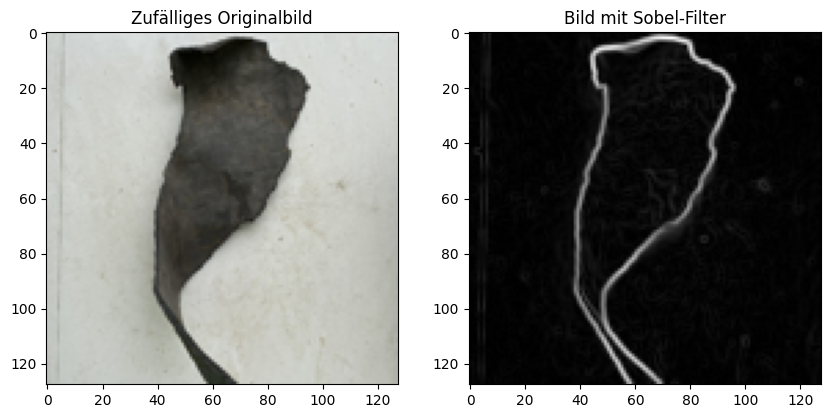

In [ ]:
# Visualisierung für das Sobel-Feature

import numpy as np
from scipy import ndimage
import matplotlib.pyplot as plt
import random

def apply_sobel_filter(image):
    """Wendet den Sobel-Filter auf ein Bild an und gibt das Ergebnis zurück."""
    # Konvertiere das Bild für den Sobel-Filter zuerst in Graustufen
    if image.ndim == 3 and image.shape[2] == 3:
        image_gray = np.mean(image, axis=2)
    else:
        image_gray = image
    image_gray = image_gray.astype(np.float32)

    sobel_x = ndimage.sobel(image_gray, axis=0)  # Sobel-Filter in x-Richtung
    sobel_y = ndimage.sobel(image_gray, axis=1)  # Sobel-Filter in y-Richtung

    # Berechne die Magnitude der Kanten
    sobel_magnitude = np.hypot(sobel_x, sobel_y)

    # Optional: Normalisiere das Ergebnis für die Anzeige
    sobel_magnitude = sobel_magnitude / np.max(sobel_magnitude)

    return sobel_magnitude

# Wähle zufällig eine Klasse und ein Bild aus dieser Klasse
random_class_name = random.choice(list(images_resized.keys()))
random_image = random.choice(images_resized[random_class_name])

# Wende den Sobel-Filter an, der das Bild automatisch zu Graustufen konvertiert
sobel_filtered_image = apply_sobel_filter(random_image)

# Zeige das Originalbild in seiner ursprünglichen Farbform und das gefilterte Bild in Graustufen
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
if random_image.ndim == 3:
    plt.imshow(random_image.astype(np.uint8))  # Stelle sicher, dass wir uint8 für Farbbilder verwenden
else:
    plt.imshow(random_image, cmap='gray')  # Für den Fall, dass das Bild bereits in Graustufen ist
plt.title('Zufälliges Originalbild')

plt.subplot(1, 2, 2)
plt.imshow(sobel_filtered_image, cmap='gray')
plt.title('Bild mit Sobel-Filter')

plt.show()


In [ ]:
sobel_sums_labeled = pd.DataFrame({
    'sobel_sum': sobel_filtered_images_sums,
    'label': label_array
})

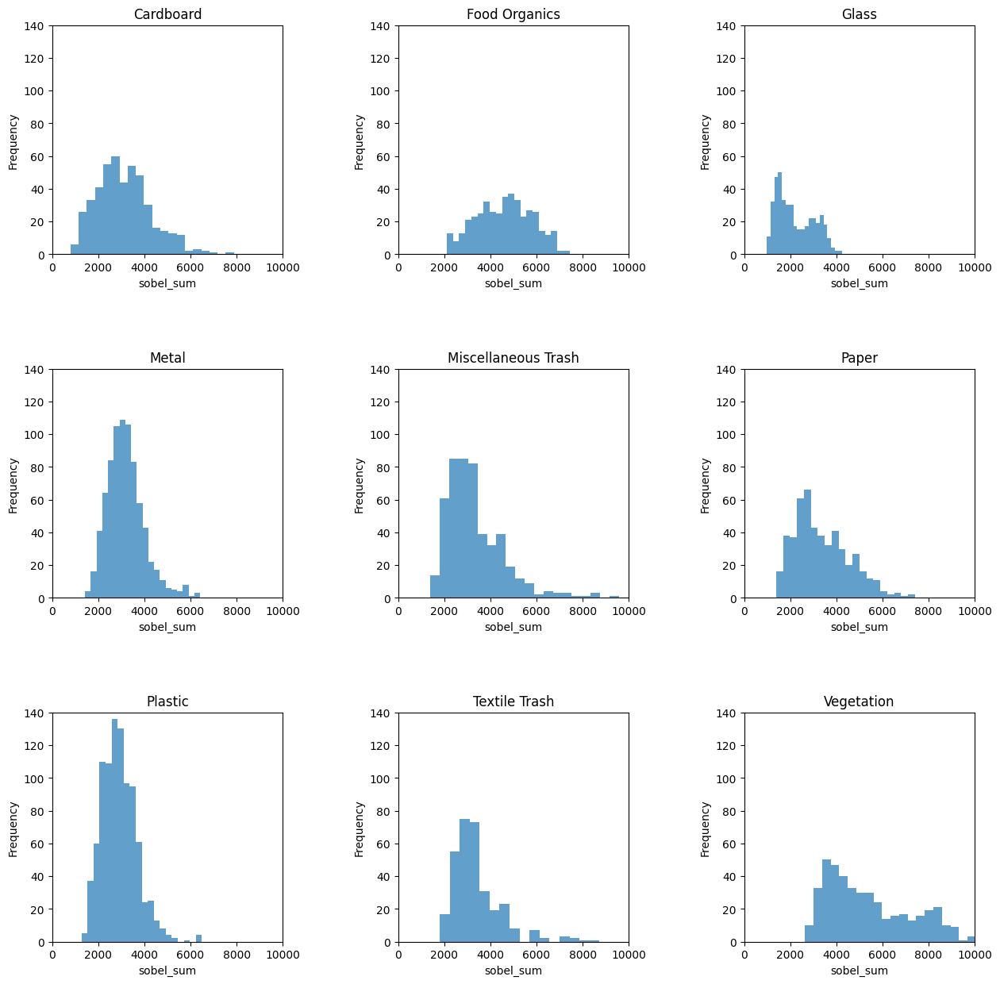

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

df_sobelsums_labeled = pd.DataFrame(sobel_sums_labeled)

# Einzigartige Labels extrahieren
labels = df_sobelsums_labeled['label'].unique()

# Plot-Einstellungen
fig, axs = plt.subplots(3, 3, figsize=(15, 15))  # 3x3 Matrix von Subplots
fig.subplots_adjust(hspace=0.5, wspace=0.5)  # Einstellung des Abstands zwischen den Plots
axs = axs.ravel()  # Umwandlung in ein 1D Array für einfachen Zugriff

for i, label in enumerate(labels):
    subset = df_sobelsums_labeled[df_sobelsums_labeled['label'] == label]
    axs[i].hist(subset['sobel_sum'], bins=20, alpha=0.7)
    axs[i].set_title(f'{label}')
    axs[i].set_xlabel('sobel_sum')
    axs[i].set_ylabel('Frequency')
    axs[i].set_xlim(0, 10000)  # Setze die Grenzen der X-Achse einheitlich für alle Plots auf 0 bis 10000
    axs[i].set_ylim(0, 140) # Setze die Grenzen der Y-Achse einheitlich für alle Plots auf 0 bis 140 (jetzt passt auch plastic drauf)

plt.show()

### Texturfeature extrahieren und visualisieren: Local Binary Patterens (LBP)

Die LBP-Featureextraktion erfordert zunächst eine Umwandlung der Bilder in Graustufen, was der Standardisierung der Intensitätswerte der Pixel dient.

Nach der Umwandlung in Graustufen werden die Pixel bezüglich ihrer Intensität mit den Pixeln in ihrer unmittelbaren Nähe verglichen (vgl. skimage lbp [(2024)](https://scikit-image.org/docs/stable/auto_examples/features_detection/plot_local_binary_pattern.html)). Das Ergebnis des Vergleichs ist ein binärer Code; eine 1 steht hierbei für _intensiver_ und eine 0 für _weniger intensiv_ als der zentrale Referenzpixel (vgl. ebd.). Diese Codes werden anschließend in ein Histogramm umgewandelt, das die Verteilung der verschiedenen Muster im Bild widerspiegelt.

Zur besseren Veranschaulichung wird nach dem Code für die LBP-Featureextraktion ein zufälliges Bild aus dem Datensatz mit seinem zugehörigen LBP-Bild nebeneinander ausgegeben.

***
**Quellen:**
* skimage lbp (2024) <br>
Dokumentation zu scikit-image <br>
Abgerufen am 28.02.2024 unter: <br>
https://scikit-image.org/docs/stable/auto_examples/features_detection/plot_local_binary_pattern.html
***

In [ ]:
from skimage.feature import local_binary_pattern
from skimage.color import rgb2gray
import numpy as np

# Parameter für LBP
P = 8  # Anzahl der kreisförmigen Nachbarn
R = 1  # Radius

# Funktion, um LBP-Features für alle Bilder zu extrahieren
def extract_lbp_features(images_resized, P, R):
    lbp_features = []
    for class_images in images_resized.values():
        for img in class_images:
            # Umwandlung in Graustufen
            img_gray = rgb2gray(img)
            # Berechnung des LBP
            lbp = local_binary_pattern(img_gray, P, R, method="uniform")
            # Umwandlung des LBP-Bildes in ein Histogramm zur Feature-Reduktion
            # und zur Erstellung eines festen Größenvektors pro Bild
            (hist, _) = np.histogram(lbp.ravel(),
                                     bins=np.arange(0, P + 3),
                                     range=(0, P + 2))
            # Normalisierung des Histogramms
            hist = hist.astype("float")
            hist /= (hist.sum() + 1e-6)
            lbp_features.append(hist)
    return np.array(lbp_features)

  # Anwendung der lbp-Funktion auf meine Bilder
feature_array_lbp = extract_lbp_features(images_resized, P, R)

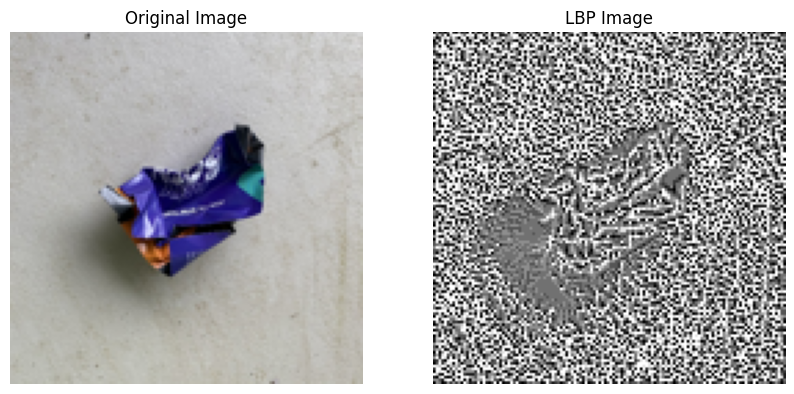

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
from skimage.feature import local_binary_pattern
from skimage.color import rgb2gray

def show_random_image_and_its_lbp(images_resized):
    # Zufällige Klasse auswählen
    class_name = random.choice(list(images_resized.keys()))
    # Zufälliges Bild aus dieser Klasse auswählen
    image_index = random.randint(0, len(images_resized[class_name]) - 1)
    original_image = images_resized[class_name][image_index]

    # Umwandlung in Graustufen
    img_gray = rgb2gray(original_image)
    # Berechnung des LBP
    lbp = local_binary_pattern(img_gray, P, R, method="uniform")

    # Visualisierung
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(original_image)
    ax[0].set_title('Original Image')
    ax[0].axis('off')

    ax[1].imshow(lbp, cmap='gray')
    ax[1].set_title('LBP Image')
    ax[1].axis('off')

    plt.show()

# P und R Parameter setzen
P = 8  # Anzahl der kreisförmigen Nachbarn
R = 1  # Radius

# Funktion aufrufen
show_random_image_and_its_lbp(images_resized)

In [ ]:
feature_array_lbp.shape

(4752, 10)

In [ ]:
import pandas as pd
import numpy as np

# Erstelle einen DataFrame aus dem feature_array_lbp
df_lbp = pd.DataFrame(feature_array_lbp, columns=[f'lbp_{i}' for i in range(feature_array_lbp.shape[1])])

# Füge die Labels als neue Spalte hinzu
df_lbp['label'] = label_array

# Ergebnis überprüfen
print(df_lbp.head(5))  # Zeige die ersten fünf Zeilen des DataFrame zur Überprüfung

      lbp_0     lbp_1     lbp_2     lbp_3     lbp_4     lbp_5     lbp_6  \
0  0.063293  0.085449  0.050110  0.088562  0.163330  0.097778  0.070496   
1  0.054871  0.085266  0.043640  0.092163  0.121277  0.124207  0.074707   
2  0.112427  0.099182  0.074463  0.082214  0.091187  0.087952  0.074402   
3  0.065918  0.077576  0.051392  0.103821  0.173096  0.107544  0.067993   
4  0.104065  0.096863  0.073303  0.092285  0.103516  0.097717  0.078369   

      lbp_7     lbp_8     lbp_9      label  
0  0.088562  0.117676  0.174744  Cardboard  
1  0.096680  0.131836  0.175354  Cardboard  
2  0.094421  0.099915  0.183838  Cardboard  
3  0.082764  0.105530  0.164368  Cardboard  
4  0.086548  0.095093  0.172241  Cardboard  


## Zusammenführung der extrahierten Features in Form eines DataFrames

In [ ]:
def add_lbp_features_to_dataframe(features_df, lbp_features_array, P):
    # Generiere Spaltennamen für LBP-Merkmale basierend auf ihrer Position im Histogramm
    lbp_columns = [f'lbp_{i}' for i in range(P + 2)]

    # Erstelle ein DataFrame aus dem LBP-Merkmalsarray mit diesen Spaltennamen
    lbp_df = pd.DataFrame(lbp_features_array, columns=lbp_columns)

    # Füge dieses DataFrame mit dem bestehenden Merkmals-DataFrame zusammen
    enhanced_features_df = pd.concat([features_df, lbp_df], axis=1)

    return enhanced_features_df

# Füge LBP-Merkmale zum DataFrame hinzu
df_features_reduced_combined = add_lbp_features_to_dataframe(df_features_reduced_combined, feature_array_lbp, P)
df_features_reduced_combined


,red_mean,red_std,green_mean,green_std,blue_mean,blue_std,sobel_sum,lbp_0,lbp_1,lbp_2,lbp_3,lbp_4,lbp_5,lbp_6,lbp_7,lbp_8,lbp_9
0,168.503540,32.215154,170.616028,36.638167,171.028564,44.670467,1551.500188,0.063293,0.085449,0.050110,0.088562,0.163330,0.097778,0.070496,0.088562,0.117676,0.174744
1,173.499939,39.203376,172.930908,43.416050,167.939941,50.787999,1685.084060,0.054871,0.085266,0.043640,0.092163,0.121277,0.124207,0.074707,0.096680,0.131836,0.175354
2,151.504333,25.128986,159.249634,30.561417,168.499756,38.381649,3401.464125,0.112427,0.099182,0.074463,0.082214,0.091187,0.087952,0.074402,0.094421,0.099915,0.183838
3,159.893921,35.130216,165.596924,44.562195,171.897034,57.273066,2822.211584,0.065918,0.077576,0.051392,0.103821,0.173096,0.107544,0.067993,0.082764,0.105530,0.164368
4,146.946960,24.629529,156.082642,31.644635,168.250244,40.639512,3422.139641,0.104065,0.096863,0.073303,0.092285,0.103516,0.097717,0.078369,0.086548,0.095093,0.172241
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4747,151.340454,59.774400,148.608154,61.164567,134.677368,68.175550,6833.218504,0.112793,0.106140,0.072205,0.075378,0.090820,0.085937,0.075134,0.095581,0.100220,0.185791
4748,151.768494,60.347893,149.364807,61.510328,135.527344,68.372839,6886.802388,0.113708,0.101929,0.077454,0.080505,0.084167,0.086853,0.075073,0.095825,0.100830,0.183655
4749,154.951416,59.333166,152.153076,61.195001,137.555908,69.744840,6729.545094,0.110168,0.105225,0.075500,0.081055,0.088989,0.089783,0.074707,0.092957,0.098328,0.183289
4750,154.458679,57.086545,152.926086,58.102958,141.966736,64.977466,6591.700920,0.113525,0.104004,0.074646,0.076172,0.088196,0.086426,0.078186,0.092590,0.099854,0.186401


## Chi^2-Unabhängigkeitstest: Prüfung der Relevanz der aggregierten, extrahierten Features

Der Chi-Quadrat-Unabhängigkeitstest ist ein nicht-parametrisches Verfahren, das in der vorliegenden Ausarbeitung dazu dient, die Unabhängigkeit zwischen den extrahierten Features und den Labels für die Klassen bewerten zu können (vgl. sklearn chi2 [(2024)](https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.chi2.html)). Der Chi-Quadrat-Test ermöglicht die Identifikation und Auswahl von Merkmalen mit einem statistisch bedeutsamen Unterschied in Bezug auf die Zielvariable, wobei hohe Chi-Quadrat-Werte auf eine starke Assoziation zwischen Feature und Zielvariable hinweisen (vgl. ebd.).
Für die Selektion von Features gilt der Chi-Quadrat-Test als erfolgversprechendes Verfahren (vgl. Shahi et al. [(2017)](https://doi.org/10.1080/10106049.2016.1213888.), S. 1406).

Die Anwendung des Chi-Quadrat-Unabhängigkeitstests erfordert eine Vorverarbeitung der Daten, weil das Verfahren ausschließlich mit nichtnegativen Werten arbeitet (vgl. sklearn chi2 [(2024)](https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.chi2.html)). Der MinMaxScaler aus der Bibliothek scikit-learn ermöglicht eine solche Skalierung (vgl. sklearn minmax [(2024)](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.MinMaxScaler.html#sklearn.preprocessing.MinMaxScaler)). <br>

Das nachfolgende, absteigende Balkendiagramm bereitet die Ergebnisse des Chi-Quadrat-Unabhängigkeitstests auf und gibt so einen visuellen Anhaltspunkt zur Relevanz der extrahierten Features.

Im Rahmen der Erarbeitung der vorliegenden EDA wurde mit der Extraktion verschiedener Features aus dem RealWaste-Datensatz experimentiert. In der finalen Abgabeform beschränkt sich die Ausarbeitung lediglich auf die weiterführende Untersuchung der bereits angesprochenen Farb-, Kanten- und Texturfeatures. Aufgrund der in der finalen Abgabeform überschaubaren Anzahl der verbleibenden Features, wird für die nachfolgende Funktion, welche die 'k' besten Features extrahiert, der Parameter k='all' gesetzt.

Für weiterführende Untersuchungen wird auf Grundlage des durchgeführten Chi-Quadrat-Unabhängigkeitstests davon ausgegangen, dass diese insgesamt 17 extrahierten Features für das Training von Modellen eingesetzt werden sollten.

***
**Quellen**:
* Shahi, K., Shafri, H., & Hamedianfar, A. (2017). Road condition assessment by OBIA and feature selection techniques using very high-resolution WorldView-2 imagery. Geocarto International, 32, 1389 - 1406. https://doi.org/10.1080/10106049.2016.1213888.
* sklearn chi2 - scikit-learn Dokumentation <br>
Abgerufen am 28.02.2024 unter: <br>
https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.chi2.html
* sklearn minmax - scikit-learn Dokumentation <br>
Abgerufen am 28.02.2024 unter: <br>
https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.MinMaxScaler.html#sklearn.preprocessing.MinMaxScaler

***

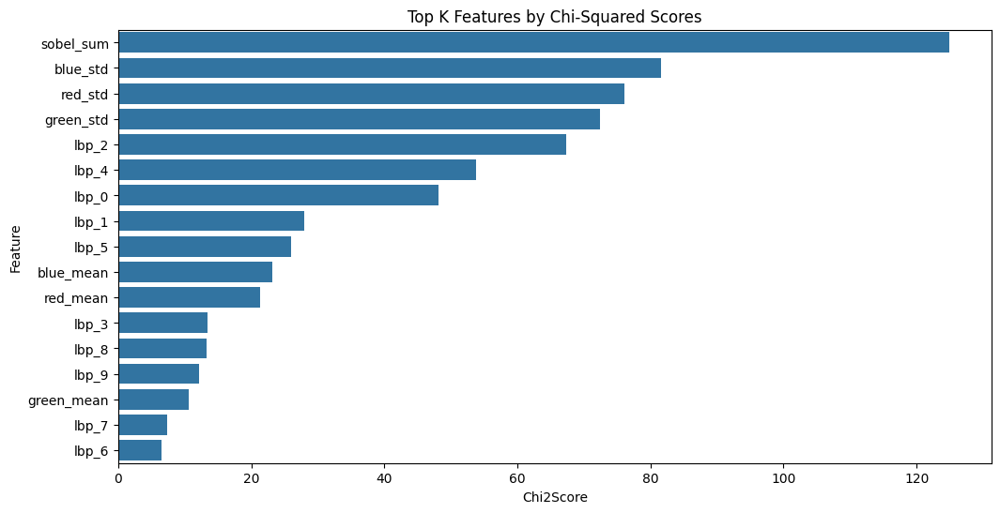

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest, chi2
import matplotlib.pyplot as plt
import seaborn as sns

def preprocess_features_non_negative(X):
    scaler = MinMaxScaler()
    X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)
    return X_scaled

def select_and_visualize_chi_squared_top_features(X, y, k='all'):  # für die k-besten Merkmale nimm hier alle
    # Initialisiere SelectKBest mit der Chi-Quadrat Score-Funktion
    chi2_selector = SelectKBest(chi2, k=k)

    # Passe das Modell an die Daten an und transformiere es, um die Top-k-Merkmale auszuwählen
    X_kbest = chi2_selector.fit_transform(X, y)

     # Hole die Scores für die Merkmale
    chi_scores = chi2_selector.scores_

    # Erstelle ein DataFrame, um die Feature-Scores zu halten
    chi_scores_df = pd.DataFrame({'Feature': X.columns, 'Chi2Score': chi_scores})
    # Sortiere das DataFrame nach den Chi-Quadrat Scores in absteigender Reihenfolge
    chi_scores_df = chi_scores_df.sort_values(by='Chi2Score', ascending=False)

    if isinstance(k, int):  # Wenn k ein Integer ist, begrenze die Anzahl der dargestellten Features
        chi_scores_df = chi_scores_df.head(k)

    # Plotting
    plt.figure(figsize=(12, 6))
    sns.barplot(x='Chi2Score', y='Feature', data=chi_scores_df, orient='h')
    plt.title('Top K Features by Chi-Squared Scores')
    plt.show()

    return X_kbest, chi_scores_df

# Vorverarbeitung der Features für den Einsatz mit Chi^2: Die Features dürfen nicht negativ sein
df_features_reduced_combined_non_negative = preprocess_features_non_negative(df_features_reduced_combined)

# Anwenden der Chi^2-Funktion
X_kbest, chi_scores_df = select_and_visualize_chi_squared_top_features(df_features_reduced_combined_non_negative, label_array)


## Principal Component Analyse (PCA) auf die aggregierten, extrahierten Features anwenden

Die Principal Component Analyse (PCA) ist eine Technik zur Dimensionsreduktion (vgl. sklearn pca [(2024)](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)). Die Dimensionen eines Datensatzes können im Rahmen einer PCA verringert werden, indem der Datensatz in einen kleineren Satz von Variablen transformiert wird (vgl. ebd.). Diese Transformation geht mit einem Informationsverlust einher, zielt aber darauf ab, einen Großteil der Informationen (Varianz) des Originaldatensatzes zu bewahren (vgl. ebd.).

Die 17 zuvor aus dem RealWaste-Datensatz extrahierten Features zu Farben, Kanten und Textur werden nachfolgend mithilfe einer PCA auf drei Dimensionen reduziert.

In der nachfolgend aufgeführten dreidimensionalen Visualisierung für die durchgeführte PCA können in der Punktwolke für einige Klassen bereits zusammenhängende Punkthäufungen identifiziert werden. Dies ist beispielsweise gut erkennbar für _Glass_ oder _Vegetation_. <br>
Wenngleich die Punktwolken der einzelnen Klassen noch immer eine deutliche Überlappung zueinander aufweisen, kann die vorliegende PCA darauf hinweisen, dass die extrahierten und durch den Chi^2-Test vorselektierten bzw. bestätigten Featues für _Farben_, _Kanten_ und _Textur_ in ihrer zuvor erarbeiteten Form vermutlich einen Beitrag zur erfolgreichen Klassifikation der Bilder aus dem RealWaste-Datensatz leisten können.

Um einen Überblick zur Form der Cluster für die einzelnen Klassen auf Grundlage der PCA zu erhalten, wurden die PCA-Ergebnisse für alle neun Klassen zusätzlich nachfolgend in einer 3x3-Matrix ausgegeben.


***
**Quellen:**
* sklearn pca (2024): scikit-learn Dokumentation <br>
Abgerufen am 28.02.2024 unter: <br>
https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html
***

In [ ]:
from sklearn.decomposition import PCA
import plotly.express as px
import pandas as pd

# PCA initialisieren und Anzahl der Komponenten festlegen
pca = PCA(n_components=3)

X_pca = pca.fit_transform(df_features_reduced_combined_non_negative)

# Data Frame erzeugen, um die PCA-Ergebnisse plotten zu können
pca_df = pd.DataFrame(data = X_pca, columns = ['Principal Component 1', 'Principal Component 2', 'Principal Component 3'])

# DF für die Labels erzeugen
pca_df['Label'] = label_array

# Interactive 3D scatter plot using Plotly
fig = px.scatter_3d(pca_df, x='Principal Component 1', y='Principal Component 2', z='Principal Component 3',
                    color='Label', color_continuous_scale=px.colors.sequential.Viridis,
                    title="PCA 3D Visualisierung für alle Klassen")

fig.update_layout(width=1000, height=800)

# Kameraeinstellungen anpassen für die initiale Ansicht
fig.update_layout(scene_camera=dict(
    eye=dict(x=-2, y=-2, z=1)  # Werte für die initiale Ansicht anpassen
))

fig.show()


In [ ]:
from sklearn.decomposition import PCA
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd

# PCA initialisieren und Anzahl der Komponenten festlegen
pca = PCA(n_components=3)

X_pca = pca.fit_transform(df_features_reduced_combined_non_negative)

# Ein 3x3 Subplot-Layout für die 3D PCA-Visualisierung jeder Klasse erstellen
fig = make_subplots(rows=3, cols=3, specs=[[{'type': 'scatter3d'} for _ in range(3)] for _ in range(3)],
                    subplot_titles=[f'Class {label}' for label in sorted(set(label_array))])

for i, label in enumerate(sorted(set(label_array))):
    # Daten für die aktuelle Klasse filtern
    class_indices = [index for index, val in enumerate(label_array) if val == label]
    class_data = df_features_reduced_combined_non_negative.iloc[class_indices]

    # PCA für die aktuelle Klasse durchführen
    pca = PCA(n_components=3)
    X_pca = pca.fit_transform(class_data)

    # PCA-Ergebnisse in ein DataFrame umwandeln
    pca_df = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2', 'PC3'])
    pca_df['Label'] = [label] * len(pca_df)

    # Bestimmen der Position im 3x3 Grid
    row = i // 3 + 1
    col = i % 3 + 1

    # 3D Scatter Plot für die aktuelle Klasse hinzufügen
    fig.add_trace(
        go.Scatter3d(
            x=pca_df['PC1'], y=pca_df['PC2'], z=pca_df['PC3'],
            mode='markers',
            marker=dict(size=3),
            name=f'Class {label}'
        ),
        row=row, col=col
    )

# Gesamtlayout anpassen
fig.update_layout(height=900, width=900, title_text="PCA 3D Visualisierung einzeln für jede Klasse")

fig.show()

# Klassische ML-Modelle

Die Klassifikationsmethode _Nearest Neighbor_ ordnet einen unklassifizierten Punkt die Klasse des nächsten Punktes aus einer Gruppe zuvor klassifizierter Punkte zu (vgl. Cover u. Hart [(1967)](https://doi.org/10.1109/TIT.1967.1053964), S. 21). Die Methode ist in ihrer Fehleranfälligkeit begrenzt; etwa die Hälfte der Informationen für eine korrekte Klassifizierung liegen in der direkten Umgebung eines Punktes (vgl. ebd.). Der Punktabstand kann hierbei ein beliebiges metrisches Maß sein, der euklidische Standardabstand ist jedoch eine häufige Wahl (vgl. sklearn nn [(2024)](https://scikit-learn.org/stable/modules/neighbors.html)). Die Methode hat sich trotz ihrer Einfachheit für Klassifizierungs- und auch für Regressionsprobleme bewährt (vgl. ebd.). Die Eigenschaft als nichtparametrisches Verfahren macht es oftmals in Klassifizierungssituationen erfolgsversprechend, die eine unregelmäßige _decision boundary_ aufweisen (vgl. ebd.).

Bei _Random Forests_ handelt es sich um ein Ensemble-Lernverfahren, bei welchem ein _"Wald"_ von zufällig unterschiedlichen Entscheidungsbäumen erstellt wird (vgl. Breiman [(2001)](https://doi.org/10.1023/A:1010933404324), S. 5). Jeder Entscheidungsbaum gibt hierbei eine Vorhersage ab; im Falle einer Klassifikation wird die häufigste Vorhersage der Bäume als endgültige Antwort des Random Forest betrachtet, im Falle einer Regression der Durchschnitt der Vorhersagen (vgl. ebd.).
Die Methode ist gut für Klassifikationsaufgaben geeignet und erweist sich als robust gegenüber Rauschen (vgl. ebd., S. 32).
Die eingeführte Zufälligkeit bei der Baumkonstruktion hilft, Überanpassung zu reduzieren, indem Vorhersagefehler entkoppelt werden, was eine Varianzreduktion bei einer potenziell leichten Erhöhung des Bias ermöglicht (vgl. sklearn rf [(2024)](https://scikit-learn.org/stable/modules/ensemble.html#random-forests-and-other-randomized-tree-ensembles)).

_Support Vector Machines_ (SVM) sind ein leistungsstarkes Verfahren in der Klassifikation, das auf flexiblen Trennlinien basiert. Im Gegensatz zu Klassifikationsbäumen, bei denen die Klassen durch Regeln zugewiesen werden, ermöglichen SVMs die Bestimmung von Grenzen mittels mathematischer Optimierungsverfahren. Diese Grenzen können beliebig geformt sein und sind nicht auf lineare Trennungen beschränkt. SVMs sind zunächst für die Zweiklassenklassifikation konzipiert, können jedoch problemlos auf Mehrklassenprobleme erweitert werden. Klassenhäufigkeiten oder -wahrscheinlichkeiten werden bei der Grenzbestimmung nicht berücksichtigt (vgl. Von der Hude [(2020)](http://link.springer.com/10.1007/978-3-658-30153-8_13), S. 179).

Nachfolgend wird eine Aufteilung zwischen Trainings- und Testdatensatz vorgenommen, die für jede Klasse 20 % der Daten für den Test und 80 % für das Training vorsieht. <br>

Die Modelle für die Ansätze k-NN, SVM und Random Forest werden auf Grundlage der o.g. 17 extrahierten Features nachfolgend trainiert, wofür bei den Algorithmen zunächst mit den default-Parametern gearbeitet wird. Für jeden der drei Modellansätze wird ein Klassifikationsbericht ausgegeben, der als Ausgangspunkt für das nachfolgende Hyperparameter-Tuning dient. Im Zuge dieses finalen Trainingsschritts der EDA wird zudem eine Kreuzvalidierung (k-fold mit k = 5) durchgeführt, um die Generalisierungsfähigkeit der Modelle auf unbekannten Daten zu bewerten und Overfitting zu vermeiden.

***
**Quellen:**
* Cortes, C., & Vapnik, V. (1995). Support-Vector Networks. Machine Learning, 20, 273-297. <br>
https://doi.org/10.1023/A:1022627411411
* Cover, T., & Hart, P. (1967). Nearest neighbor pattern classification. IEEE Trans. Inf. Theory, 13, 21-27. <br>
https://doi.org/10.1109/TIT.1967.1053964
* Breiman, L. (2001). Random Forests. Machine Learning, 45, 5-32. <br> https://doi.org/10.1023/A:1010933404324
* sklearn nn (2024): Dokumentation zu scikit-learn<br>
Abgerufen am 28.02.2024 unter: <br>
https://scikit-learn.org/stable/modules/neighbors.html
* sklearn rf (2024): Dokumentation zu scikit-learn <br>
Abgerufen am 28.02.2024 unter: <br>
https://scikit-learn.org/stable/modules/ensemble.html#random-forests-and-other-randomized-tree-ensembles
* Von der Hude, M. (2020). Support-Vector-Machines. 179-199. <br>
http://link.springer.com/10.1007/978-3-658-30153-8_13


## Aufteilung Trainings- und Testdatensatz

In [ ]:
from sklearn.model_selection import StratifiedShuffleSplit

def stratified_shuffle_split(X, y, test_size=0.2, random_state=42):
    sss = StratifiedShuffleSplit(n_splits=1, test_size=test_size, random_state=random_state)

    for train_index, test_index in sss.split(X, y):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

    return X_train, X_test, y_train, y_test

X_train, X_test, y_train, y_test = stratified_shuffle_split(df_features_reduced_combined_non_negative.to_numpy(), label_array, test_size=0.2, random_state=42)

## Modelltraining durchführen

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

def train_and_evaluate(X_train, X_test, y_train, y_test):
    # Initialisierung der Modelle
    models = {
        "KNN": KNeighborsClassifier(),
        "SVM": SVC(),
        "Random Forest": RandomForestClassifier(random_state=42)
    }

    # Training der Modelle und Auswertung
    for name, model in models.items():
        model.fit(X_train, y_train)  # Training
        y_pred = model.predict(X_test)  # Vorhersage

        print(f"=== {name} ===")
        print("Accuracy Score:", accuracy_score(y_test, y_pred))
        print("Classification Report:")
        print(classification_report(y_test, y_pred))
        print("\n")

#### Klassifikationsberichte, basierend auf der aggregierten Extraktion von Features

In [ ]:
train_and_evaluate(X_train, X_test, y_train, y_test)

=== KNN ===
Accuracy Score: 0.6288117770767613
Classification Report:
                     precision    recall  f1-score   support

          Cardboard       0.64      0.72      0.68        92
      Food Organics       0.64      0.73      0.68        82
              Glass       0.69      0.77      0.73        84
              Metal       0.57      0.65      0.60       158
Miscellaneous Trash       0.51      0.48      0.49        99
              Paper       0.58      0.43      0.49       100
            Plastic       0.64      0.59      0.61       185
      Textile Trash       0.58      0.44      0.50        64
         Vegetation       0.83      0.89      0.86        87

           accuracy                           0.63       951
          macro avg       0.63      0.63      0.63       951
       weighted avg       0.63      0.63      0.62       951



=== SVM ===
Accuracy Score: 0.5814931650893796
Classification Report:
                     precision    recall  f1-score   support



## Hyperparameter-Tuning, Kreuzvalidierung und Ergebnisvisualisierung

Die Bewertung der untersuchten Modellansätze für _k-NN_, _SVM_ und _Random Forest_ basiert auf üblichen Metriken wie _Precision_, _Recall_, _F1-Score_ sowie der _Accuracy_ auf dem Test-set, nach der Anwendung von Hyperparameter-Tuning mithilfe von _GridSearchCV_. Die im Folgenden beschriebenen Ergebnisse beziehen sich auf den nachfolgenden Code sowie die zugehörigen Visualisierungen.

**k-NN** zeigte eine Testset-Genauigkeit von 65 %. Die identifizierte Konfiguration mit dem besten Ergebnis verwendete die euklidische Distanz, 5 Nachbarn und gewichtete Distanzen. Die F1-Scores über die verschiedenen Müll-Kategorien hinweg waren recht ausgeglichen, mit der höchsten Bewertung für _Vegetation_ (0.85) und der niedrigsten für _Miscellaneous Trash_ und _Paper_ (beide etwa 0.52-0.53). Dies deutet darauf hin, dass das Modell stark bei der Erkennung von Vegetation performed, aber Schwierigkeiten hat, andere Abfallklassen präzise zu identifizieren.

**SVM** erreichte eine Testset-Genauigkeit von 64 % mit den optimalen identifizierten Parametern C=10, gamma='scale' und dem rbf-Kernel. Ähnlich wie k-NN zeigte SVM eine starke Leistung bei der Klassifikation von _Vegetation_ (F1-Score von 0.85), hatte jedoch Probleme mit _Miscellaneous Trash_, wo der F1-Score nur 0.41 betrug. Die Ergebnisse zeigen, dass SVM besonders effektiv bei der Klassifikation von Food Organics und Vegetation war.

**Random Forest** erzielte die höchste Testset-Genauigkeit unter den Modellen mit 66 %. Die beste durchgeführte Konfiguration umfasste eine maximale Tiefe von 20 sowie einen min_samples_split von 2 bei 100 Bäumen. Der Random Forest Algorithmus zeigte eine starke Leistung über alle Abfallkategorien hinweg, mit den höchsten F1-Scores für _Vegetation_ (0.83) und relativ schwachen Leistungen für _Miscellaneous Trash_ (0.50) und _Textile Trash_ (0.44). Die Ergebnisse legen nahe, dass Random Forest besonders gut darin performed, Vegetation zu klassifizieren und im Vergleich zu den anderen Modellen eine etwas konsistentere Leistung über die verschiedenen Kategorien des RealWaste-Datensatzes hinweg bot.

***
Der direkte Vergleich der drei untersuchten Modelle zeigt, dass Random Forest auf Grundlage der in dieser EDA durchgeführten Merkmalsextraktion die insgesamt beste Klassifizierungsleistung erbrachte, wenngleich die Modelle in Bezug auf ihre Gesamtperformance gemessen an der _Cross Validation Accuracy_ sowie der _Test Accuracy_ zusammenfassend ein ähnliches Leistungsniveau erreichten.

Die für die Modelle angeführten Accuracy-Werte konnten auf Grundlage der im Rahmen der EDA durchgeführten Featureextraktion für Farb-, Kanten- und Texturbezogene Merkmale erzielt werden.

Es erscheint als wahrscheinlich, dass durch die Extraktion und gezielte Auswahl weiterer Merkmale die Leistung der klassischen ML-Modelle noch weiter gesteigert werden könnte. Auffallend hohe Werte bei der Fehlklassifikation finden sich für alle untersuchten Modellansätze zwischen den Klassen _Metal_ und _Plastic_.
Ein weiteres Feature Engineering könnte demnach darauf abzielen, eine genauere Differenzierung zwischen insbesondere diesen aber auch weiteren Klassen anzustreben.
Dieser weiterführende Schritt unterbleibt an dieser Stelle jedoch bewusst, da die im Rahmen der vorliegenden EDA dokumentierten Ergebnisse in Form von Visualisierung, Featureextraktion und den auf dieser Grundlage erreichten Klassifikationsgenauigkeiten der klassischen Modelle als hinreichender Proof of Concept verstanden werden können. Der weiterführende Einsatz rechenintensiver Methoden aus dem Bereich des Deep-Learning im weiteren Verlauf der Ausarbeitung kann somit als gerechtfertigt angenommen werden.


=== KNN ===
Best parameters: {'metric': 'euclidean', 'n_neighbors': 5, 'weights': 'distance'}
Best cross-validation accuracy: 0.6669320146621481
Test set accuracy: 0.647739221871714
Classification Report:
                     precision    recall  f1-score   support

          Cardboard       0.72      0.65      0.69        92
      Food Organics       0.75      0.68      0.71        82
              Glass       0.81      0.79      0.80        84
              Metal       0.58      0.61      0.59       158
Miscellaneous Trash       0.53      0.52      0.52        99
              Paper       0.57      0.50      0.53       100
            Plastic       0.61      0.66      0.64       185
      Textile Trash       0.56      0.55      0.55        64
         Vegetation       0.80      0.91      0.85        87

           accuracy                           0.65       951
          macro avg       0.66      0.65      0.65       951
       weighted avg       0.65      0.65      0.65       951


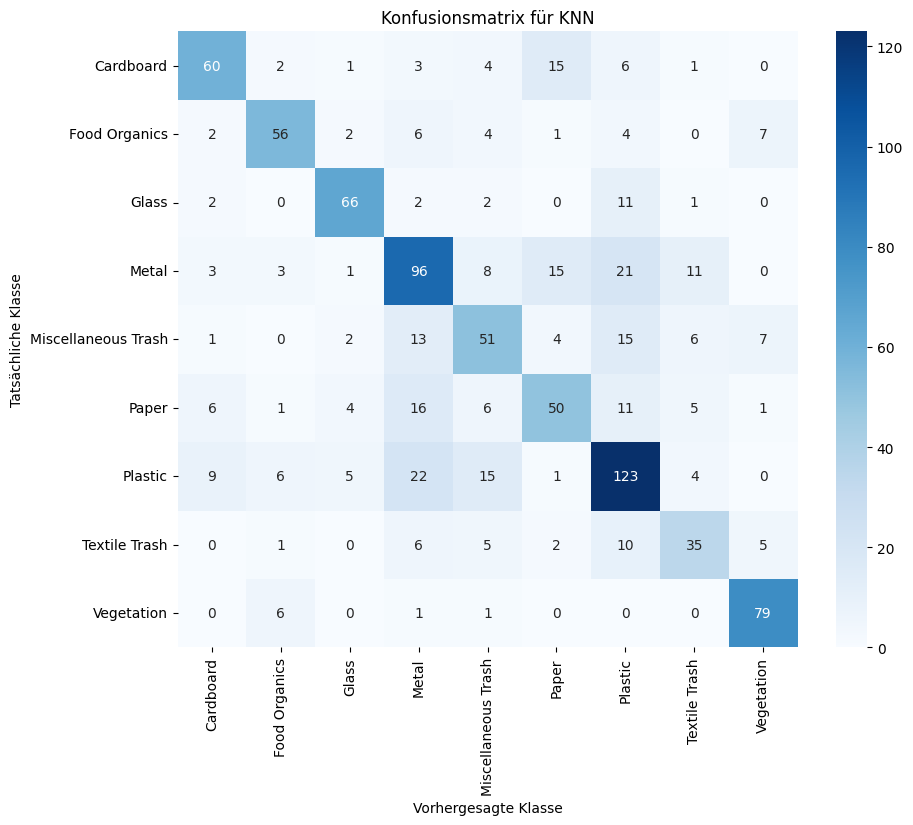

=== SVM ===
Best parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}
Best cross-validation accuracy: 0.6595594439449478
Test set accuracy: 0.6393270241850684
Classification Report:
                     precision    recall  f1-score   support

          Cardboard       0.75      0.68      0.72        92
      Food Organics       0.73      0.80      0.76        82
              Glass       0.74      0.58      0.65        84
              Metal       0.60      0.65      0.62       158
Miscellaneous Trash       0.43      0.40      0.41        99
              Paper       0.58      0.52      0.55       100
            Plastic       0.59      0.73      0.65       185
      Textile Trash       0.74      0.36      0.48        64
         Vegetation       0.82      0.89      0.85        87

           accuracy                           0.64       951
          macro avg       0.66      0.62      0.63       951
       weighted avg       0.64      0.64      0.63       951









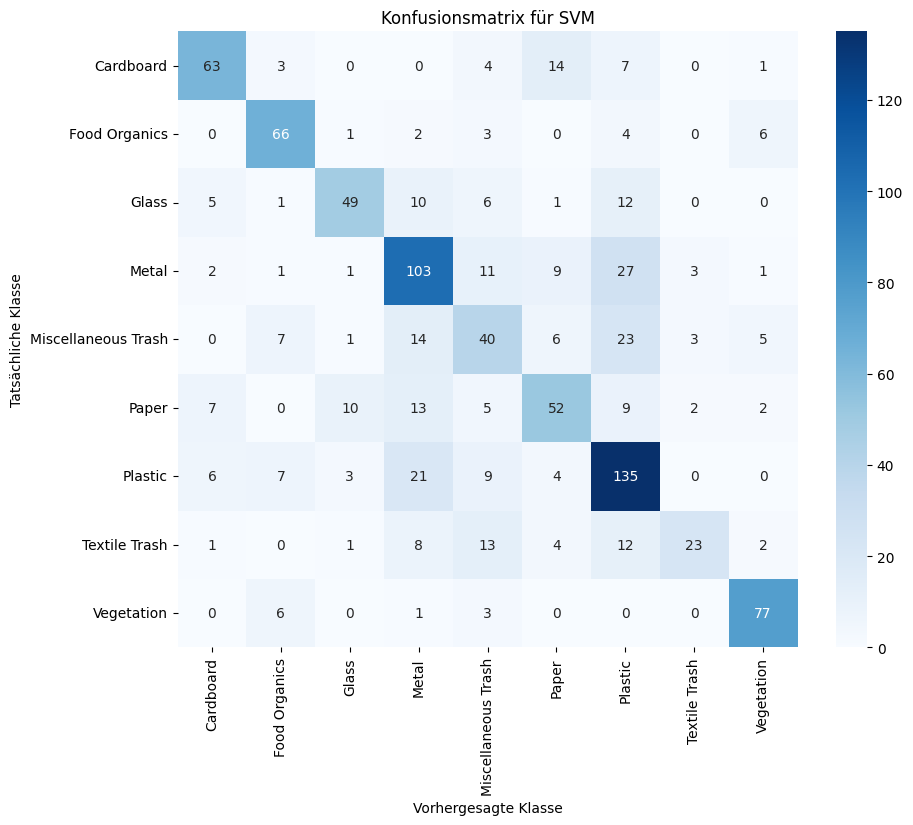

=== Random Forest ===
Best parameters: {'max_depth': 20, 'min_samples_split': 2, 'n_estimators': 100}
Best cross-validation accuracy: 0.6658786914724393
Test set accuracy: 0.6624605678233438
Classification Report:
                     precision    recall  f1-score   support

          Cardboard       0.74      0.72      0.73        92
      Food Organics       0.79      0.73      0.76        82
              Glass       0.83      0.65      0.73        84
              Metal       0.57      0.66      0.62       158
Miscellaneous Trash       0.58      0.47      0.52        99
              Paper       0.62      0.48      0.54       100
            Plastic       0.61      0.78      0.69       185
      Textile Trash       0.67      0.41      0.50        64
         Vegetation       0.76      0.91      0.83        87

           accuracy                           0.66       951
          macro avg       0.69      0.65      0.66       951
       weighted avg       0.67      0.66      0.66  

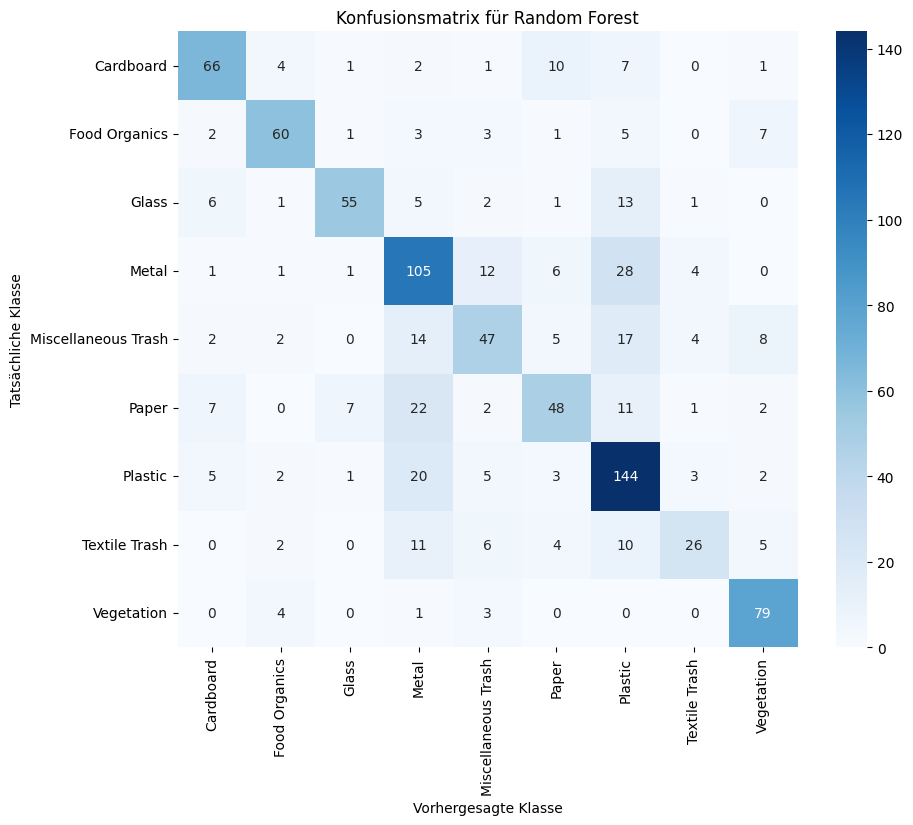

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV


# Definiere die Klassenbeschriftungen
class_labels = np.unique(label_array)

def train_and_evaluate_with_tuning(X_train, X_test, y_train, y_test):
    model_params = {
        "KNN": {
            "model": KNeighborsClassifier(),
            "params": {
                "n_neighbors": [3, 5, 7, 9],
                "weights": ["uniform", "distance"],
                "metric": ["euclidean", "manhattan"]
            }
        },
        "SVM": {
            "model": SVC(),
            "params": {
                "C": [0.1, 1, 10],
                "kernel": ["rbf", "linear"],
                "gamma": ["scale", "auto"]
            }
        },
        "Random Forest": {
            "model": RandomForestClassifier(random_state=42),
            "params": {
                "n_estimators": [10, 50, 100],
                "max_depth": [None, 10, 20, 30],
                "min_samples_split": [2, 5, 10]
            }
        }
    }

    for name, mp in model_params.items():
        clf = GridSearchCV(mp["model"], mp["params"], cv=5, scoring='accuracy')
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)

        print(f"=== {name} ===")
        print("Best parameters:", clf.best_params_)
        print("Best cross-validation accuracy:", clf.best_score_)
        print("Test set accuracy:", accuracy_score(y_test, y_pred))
        print("Classification Report:")
        print(classification_report(y_test, y_pred, target_names=class_labels))
        print("\n")
        print("\n")
        print("\n")

        # Konfusionsmatrix erstellen
        cm = confusion_matrix(y_test, y_pred)

        # Konfusionsmatrix visualisieren
        plt.figure(figsize=(10, 8))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)
        plt.title(f'Konfusionsmatrix für {name}')
        plt.ylabel('Tatsächliche Klasse')
        plt.xlabel('Vorhergesagte Klasse')
        plt.show()

# Modelltraining mit Hyperparameter-Tuning und Kreuzvalidierung durchführen
train_and_evaluate_with_tuning(X_train, X_test, y_train, y_test)